# Image Augmentation


### Start with Flipping and Cropping

In [1]:
from torchvision import transforms
import matplotlib.pyplot as plt
from PIL import Image
import math


def display_images(images, title, cols=3):
    """Function to display images in rows with a specific number of columns."""
    rows = math.ceil(len(images) / cols)  # Calculate the number of rows needed
    fig, axs = plt.subplots(rows, cols, figsize=(6 * cols, 6 * rows))

    # Flatten the axis array for easy indexing
    axs = axs.flatten()

    # Iterate through all provided images and titles
    for i, img in enumerate(images):
        axs[i].imshow(img)
        axs[i].set_title(str(i) + " " + title)
        axs[i].axis('off')

    # Hide any unused subplots
    for j in range(i + 1, rows * cols):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()
    
img = Image.open("./img/comp_vision/cat1.png")

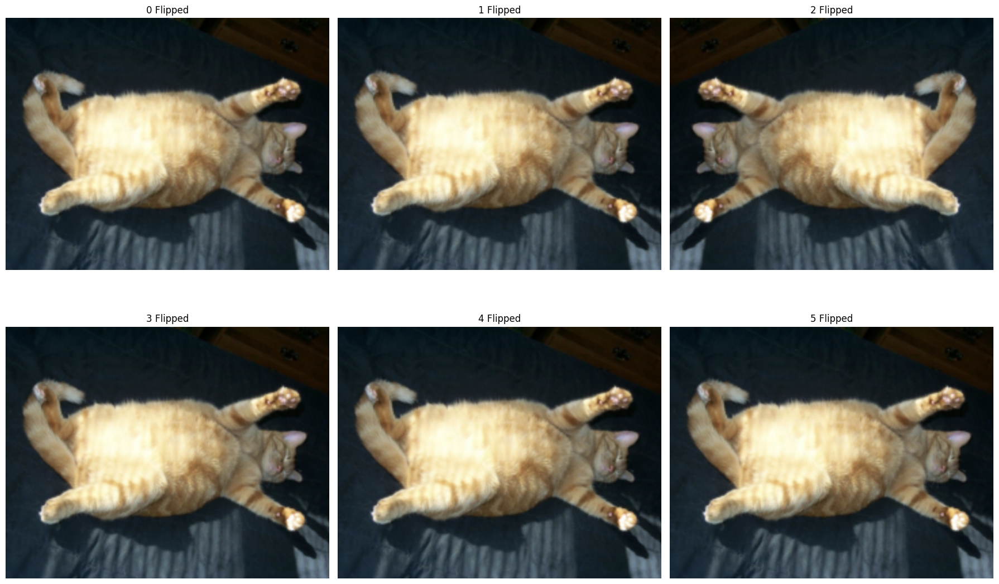

In [2]:
def flip_image(image):
    """Function to flip an image horizontally."""
    transform = transforms.RandomHorizontalFlip(p=0.6)
    return transform(image)

images = []
for i in range(6):
    images.append(flip_image(img))
display_images(images, "Flipped")

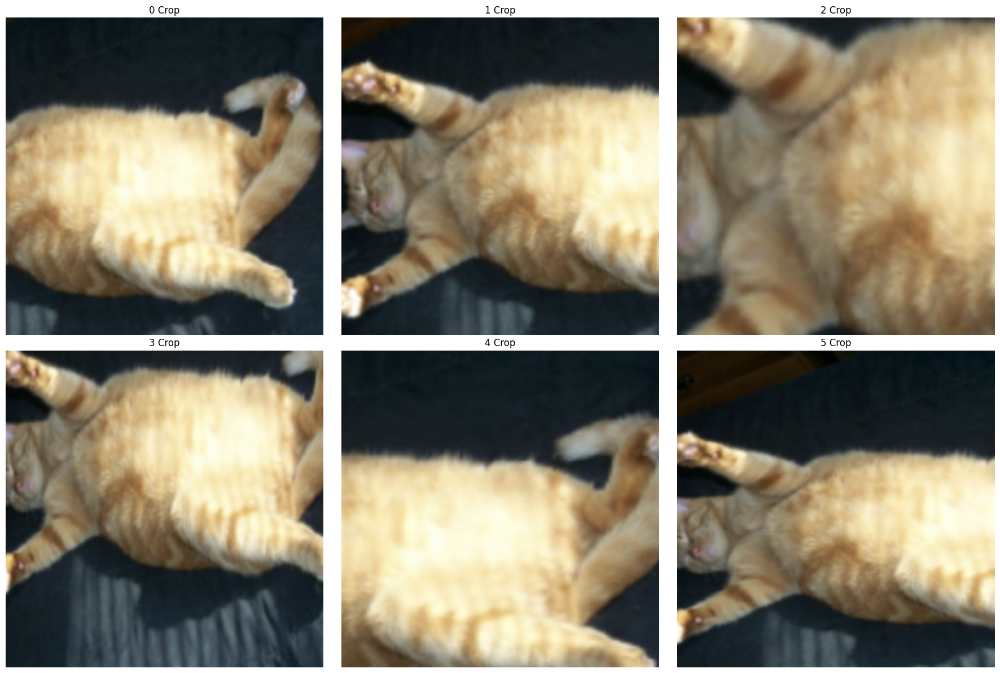

In [17]:
def crop_image(image, size):
    """Function to crop an image to a specified size."""
    transform = transforms.RandomResizedCrop(size)
    return transform(image)

images = []
for i in range(6):
    images.append(crop_image(img, (300, 300)))
display_images(images, "Crop")

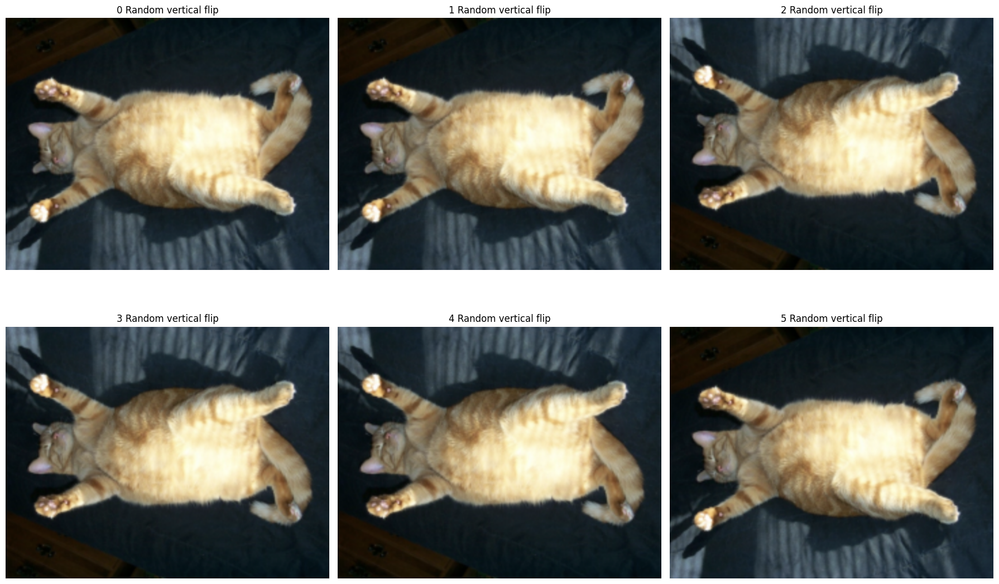

In [4]:
def flip_image(image):
    """Function to flip an image horizontally."""
    transform = transforms.RandomVerticalFlip(p=0.4)
    return transform(image)


images = []
for i in range(6):
    images.append(flip_image(img))
    
display_images(images, "Random vertical flip")
    

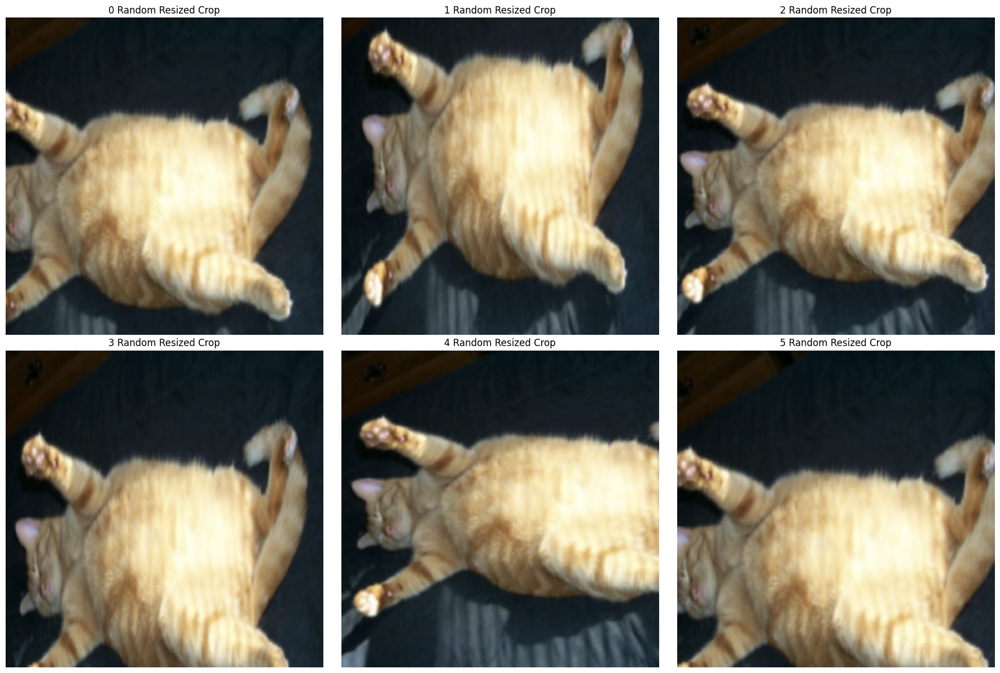

In [22]:
def random_resize_crop_image(image, size_the_crop=(500, 500)):
    """Function to flip an image horizontally."""
    transform = transforms.RandomResizedCrop(size_the_crop, scale=(0.5, 1), ratio=(0.7, 2))
    return transform(image)

images = []
for i in range(6):
    images.append(random_resize_crop_image(img))
    
display_images(images, "Random Resized Crop")

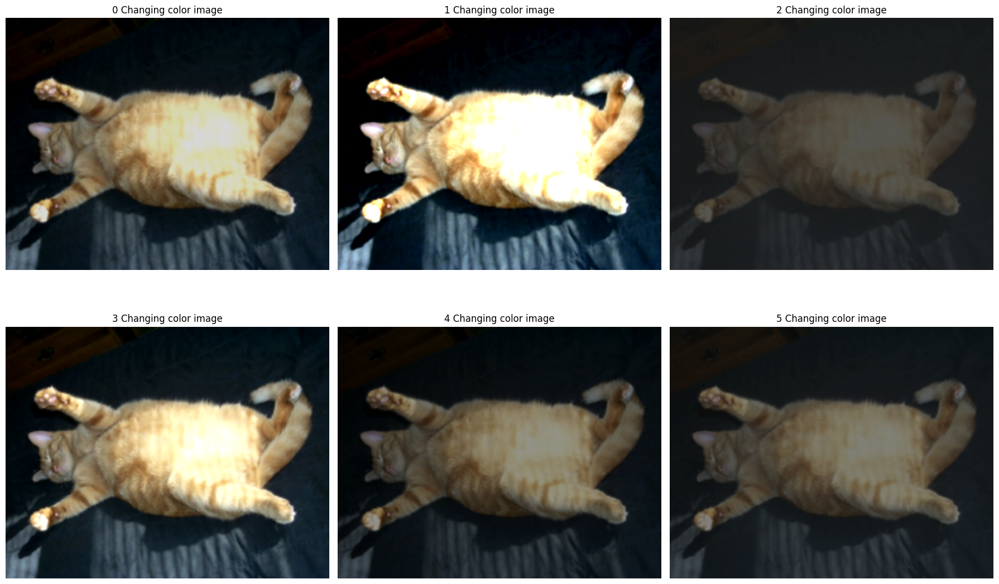

In [23]:
def changing_color_image(image):
    """Function to flip an image horizontally."""
    transform = transforms.ColorJitter(brightness=0.5, contrast=1, saturation=0, hue=0)
    return transform(image)

images = []
for i in range(6):
    images.append(changing_color_image(img))
    
display_images(images, "Changing color image")

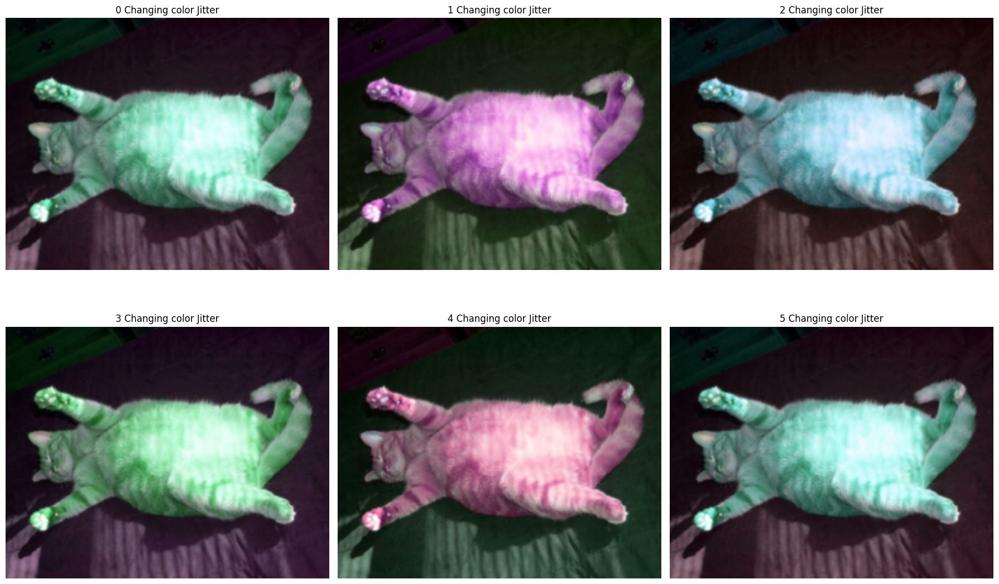

In [24]:
def changing_color_image(image):
    """Function to flip an image horizontally."""
    transform = transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=0.5)
    return transform(image)

images = []
for i in range(6):
    images.append(changing_color_image(img))
    
display_images(images, "Changing color Jitter")

### Combining Multiple Image Augmentation Methods
In practice, we will combine multiple image augmentation methods. For example, we can combine the different image augmentation methods defined above and apply them to each image via a Compose instance.

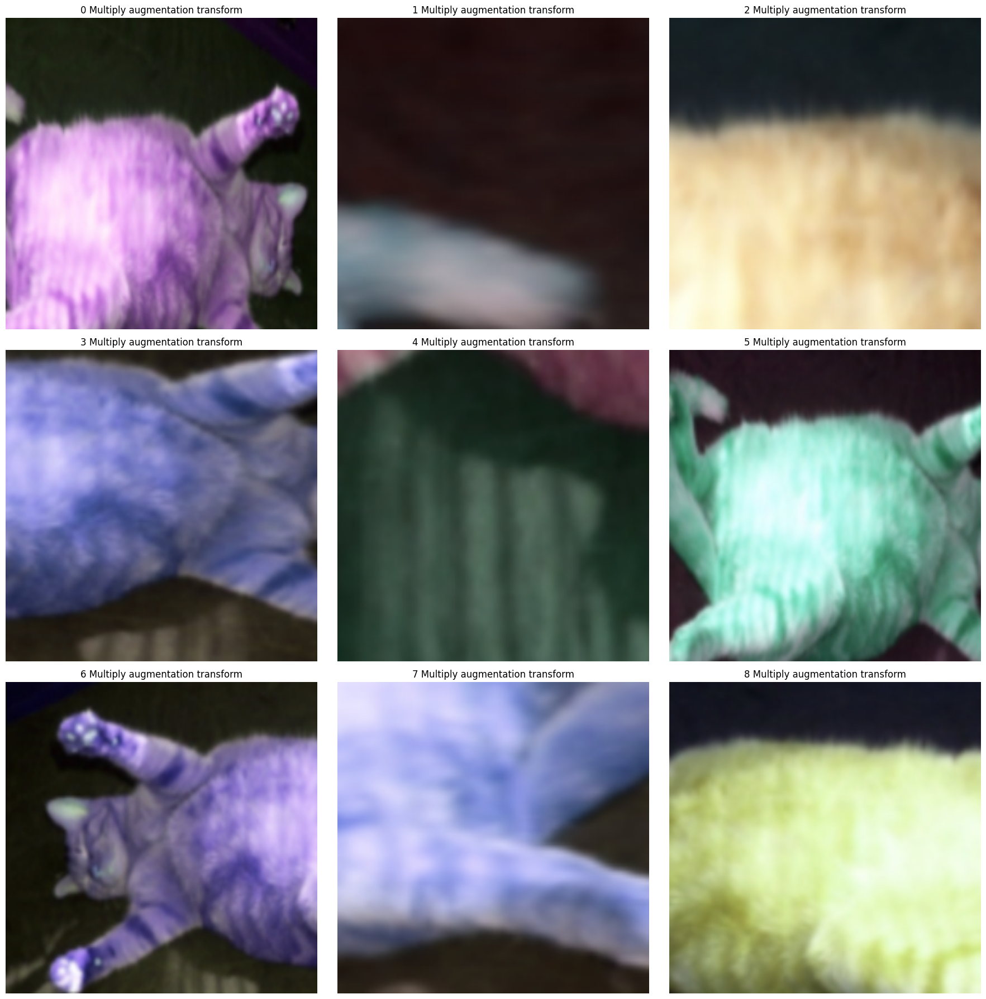

In [25]:
aug_crop = transforms.RandomResizedCrop((200,200), scale=(0.1, 1), ratio=(0.5, 2))
aug_resize_crop = transforms.RandomResizedCrop((250, 250))
aug_color = transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=0.5)

aug_transform = transforms.Compose([transforms.RandomHorizontalFlip(), aug_color, aug_crop, aug_resize_crop])

images = []
for i in range(9):
    images.append(aug_transform(img))

display_images(images, "Multiply augmentation transform")

# Fine-Tuning

most of the images in the ImageNet dataset have nothing to do with chairs, the model trained on this dataset may extract more general image features, which can help identify edges, textures, shapes, and object composition. These similar features may also be effective for recognizing chairs.

Fine-tuning consists of the following four steps:

- 1. Pretrain a neural network model, i.e., the source model, on a source dataset (e.g., the ImageNet dataset)
- 2. Create a new neural network model, i.e., the target model. This copies all model designs and their parameters on the source model except the output layer. (model parameters contain the knowledge learned from the source dataset and this knowledge will also be applicable to the target dataset.)
- 3. Add an output layer to the target model, whose number of outputs is the number of categories in the target dataset. Then randomly initialize the model parameters of this layer.
- 4. Train the target model on the target dataset, such as a chair dataset. The output layer will be trained from scratch, while the parameters of all the other layers are fine-tuned based on the parameters of the source model.

<img src="./img/comp_vision/fine_tuned.png" alt="seg2seq" width="700"/>

In [ ]:
# Import necessary modules
import certifi
import ssl
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST


# Set SSL certificate
ssl._create_default_https_context = ssl._create_unverified_context
ssl._create_default_https_context = lambda: ssl.create_default_context(cafile=certifi.where())


# Load a pre-trained ResNet-18 model
finetune_net = torchvision.models.resnet18(pretrained=True)

# Modify the fully connected layer for 10 output classes

# Is indeed a new fully connected layer that is initially without any training. 
finetune_net.fc = nn.Linear(finetune_net.fc.in_features, 10)
nn.init.xavier_uniform_(finetune_net.fc.weight)

# Define a transformation for the FashionMNIST dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to the size expected by ResNet
    transforms.Grayscale(num_output_channels=3),  # Convert to 3-channel grayscale images
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize the dataset for 3 channels
])

# Load the FashionMNIST dataset

# Define the ranges
train_range = range(0, 100)  # From 0 to 99 (inclusive)
test_range = range(100, 10) # From 100 to 199 (inclusive)

# Load the full FashionMNIST dataset
full_dataset = FashionMNIST(root='./data/FashionMNIST/', train=True, download=True, transform=transform)

# Create subsets for training and testing using the specified ranges
train_dataset = torch.utils.data.Subset(full_dataset, train_range)
test_dataset = torch.utils.data.Subset(full_dataset, test_range)


# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Define the training function
def fine_tune(model, train_loader, test_loader, epochs=10, lr=0.001, device='cpu'):
    # Move model to the specified device
    #model = model.to(device)
    
    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    # Training loop
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            
            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
        
        # Print progress
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {total_loss/len(train_loader)}")
    
    # Evaluate the model
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 1
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
# Fine-tune the model
fine_tune(finetune_net, train_loader, test_loader, epochs=3)

/Users/imax/Documents/github/neural_n00b/env_nn_n00b/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/imax/Documents/github/neural_n00b/env_nn_n00b/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/3], Loss: 2.4849051237106323
Epoch [2/3], Loss: 0.92979896068573
Epoch [3/3], Loss: 0.17346883565187454


### Summary

- Transfer learning transfers knowledge learned from the source dataset to the target dataset. Fine-tuning is a common technique for transfer learning.

- The target model copies all model designs with their parameters from the source model **except the output layer**, and fine-tunes these parameters based on the target dataset. In contrast, the output layer of the target model needs to be trained from scratch.

- Generally, fine-tuning parameters uses a smaller learning rate, while training the output layer from scratch can use a larger learning rate.

# Object Detection and Bounding Boxes

- Often multiple objects in the image of interest. We not only want to know their categories, but also their specific positions in the image. In computer vision, we refer to such tasks as object detection (or object recognition).

- Usage example:
1. Security systems may need to detect abnormal objects, such as intruders or bombs
2. Self-driving needs to plan traveling routes by detecting the positions of vehicles, pedestrians, roads...
3. Robots may use this technique to detect and localize objects of interest throughout its navigation of an environment.

## Best Practices for Labeling Bounding Boxes

1. **Consistent Labeling:** 

It’s crucial to ensure that the same object class is consistently labeled with the same name across all images in the dataset.

<img src="./img/comp_vision/consistent_labeling.png" alt="consistent_labeling" width="700"/>


2. **Tight Boxes:**

A "tight" bounding box is one that fits closely around the object with minimal space between the edges of the box and the object.

<img src="./img/comp_vision/tight_boxes.png" alt="consistent_labeling" width="700"/>

3. **Overlapping Boxes:** 

(Multiple Detections many instances of the same object in the same area): The same object might be detected multiple times by the algorithm, resulting in several bounding boxes covering the same object.

<img src="./img/comp_vision/multiple_detections.png" alt="multiple_detections" width="700"/>

(Nearby Objects): When two or more objects are close to each other, their bounding boxes might intersect or overlap.

<img src="./img/comp_vision/nearby_objects.png" alt="nearby_objects" width="400"/>

4. **Occlusion and Truncation(Усічений):** 

This occurs when a part of the object of interest is blocked or obscured by another object. In real-world scenarios, occlusion is common – for example, a pedestrian partially hidden behind a parked car.


**Occluded Good example:** annotate all visible parts of the object.

<img src="./img/comp_vision/occluded_good.png" alt="nearby_objects" width="400"/>

**Occluded Bad example:** missed some visible parts of the object.

<img src="./img/comp_vision/occluded_bad.png" alt="nearby_objects" width="400"/>

**Trancated Усічений:**
Partial visibility of an object in an image, where only a portion of the object is captured within the frame. 
This happens when the object extends beyond the boundaries of the image, making it challenging for algorithms to fully detect and recognize it.


6. **Label All Instances**
Ensure that every instance of the object class is labeled in each image, even if the instances are small or partially visible.


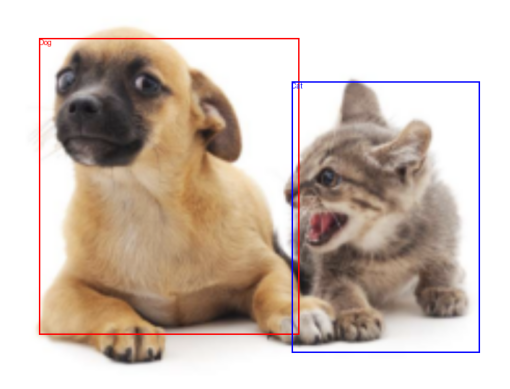

In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageDraw

def draw_bounding_boxes(image, boxes):
    """
    Draws bounding boxes with labels on an image and displays it in a Jupyter Notebook.

    Parameters:
    - image (PIL.Image or torch.Tensor): The image to draw boxes on.
    - boxes (List[List[int, str, str]]): A list of bounding boxes with class names and colors. 
      Each box is a list: [xmin, ymin, xmax, ymax, 'class_name', 'color'].
    
    Returns:
    None. Displays the image with bounding boxes in the Jupyter Notebook.
    """
    if isinstance(image, torch.Tensor):
        # Convert torch.Tensor to PIL Image
        image = transforms.ToPILImage()(image)

    draw = ImageDraw.Draw(image)

    for box in boxes:
        xmin, ymin, xmax, ymax, class_name, color = box
        draw.rectangle(((xmin, ymin), (xmax, ymax)), outline=color, width=2)
        draw.text((xmin, ymin), class_name, fill=color)
        
    # Display the image with bounding boxes in Jupyter Notebook
    plt.imshow(image)
    plt.axis('off')
    plt.show()    


# Example usage
image = Image.open('./img/comp_vision/dog_cat.png')

boxes = [
    # First bounding box: top-left corner at (40, 40), bottom-right corner at (400, 450)
    [40, 40, 400, 450, 'Dog', 'red'],   # First bounding box for 'Dog'
    # Second bounding box: top-left corner at (390, 100), bottom-right corner at (650, 475)
    [390, 100, 650, 475, 'Cat', 'blue']  # Second bounding box for 'Cat'
]

draw_bounding_boxes(image, boxes)

# Anchor Boxes
They are pre-defined, fixed-sized boxes that serve as references at different scales and aspect ratios to detect objects of various shapes and sizes in an image. The model adjusts these anchor boxes to closely fit the actual boundaries of the cat, improving the accuracy of detection.

- **Anchor boxes** to match the ground-truth object locations
- **Ground-truth** annotations used to evaluate the model’s accuracy in localizing objects
- **The same mid point** If objects have the same mid point 


### Benefits of Anchor Boxes:

**Detecting Multiple Objects:** When there are several objects in an image, anchor boxes help in identifying each object distinctly, even if they are of different sizes or shapes.

**Handling Varying Sizes and Aspect Ratios:** Objects in real-world images come in various sizes and shapes. Anchor boxes, with their varied sizes and aspect ratios, are effective in detecting objects ranging from small to large, and from square-shaped to elongated.

**Improving Detection Accuracy:** By adjusting predefined anchor boxes to fit the actual objects, the model can more accurately predict the location and size of each object.

<img src="./img/comp_vision/anchor_boxes_overlaping.png" alt="nearby_objects" width="700"/>


<img src="./img/comp_vision/anchor_boxes_car_only.png" alt="nearby_objects" width="700"/>



# Bounding Boxes VS Anchor Boxes

## Bounding Boxes: 
### {
    
**Purpose:** Bounding boxes are the final output of object detection models. They are the rectangles that directly outline and define the location and size of an actual object in an image.

**Characteristics:** Each bounding box is defined by coordinates (usually the top-left and bottom-right corners) that specify the exact position of an object.

**Use:** They are used to visually indicate where objects are in an image and are often accompanied by labels to specify what the object is.
### }


## Anchor Boxes: 
### {

**Purpose:** Anchor boxes are used during the training of an object detection model. They are predefined, fixed-sized boxes that the model uses as references to **predict** the **real bounding boxes.**

**Characteristics:** Anchor boxes come in various sizes and aspect ratios to cover different possible shapes and sizes of objects that could appear in the image. They are not the final output but a part of the detection process.

**Use:** They help the model in learning how to adjust these references to match the shape and location of real objects in the image, especially useful for detecting multiple objects and handling objects of varying sizes and shapes.
### }



In summary, bounding boxes are the end result showing the located objects, while anchor boxes are tools used during the model training process to help accurately predict these bounding boxes.

#  Intersection over Union

We can measure the similarity between the anchor box and the ground-truth(**true location and shape of an object**) bounding box.

We know that the Jaccard index can measure the similarity between two sets. Given sets A and B


<img src="./img/comp_vision/Jaccard_index.png" alt="nearby_objects" width="400"/>

<img src="./img/comp_vision/Jaccard_index_explained.png" alt="nearby_objects" width="400"/>

In fact, we can consider the **pixel area** of any bounding box as a set of **pixels**. In this way, we can measure the similarity of the two bounding boxes by the Jaccard index of their pixel sets

/Users/imax/Documents/github/neural_n00b/env_nn_n00b/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/imax/Documents/github/neural_n00b/env_nn_n00b/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


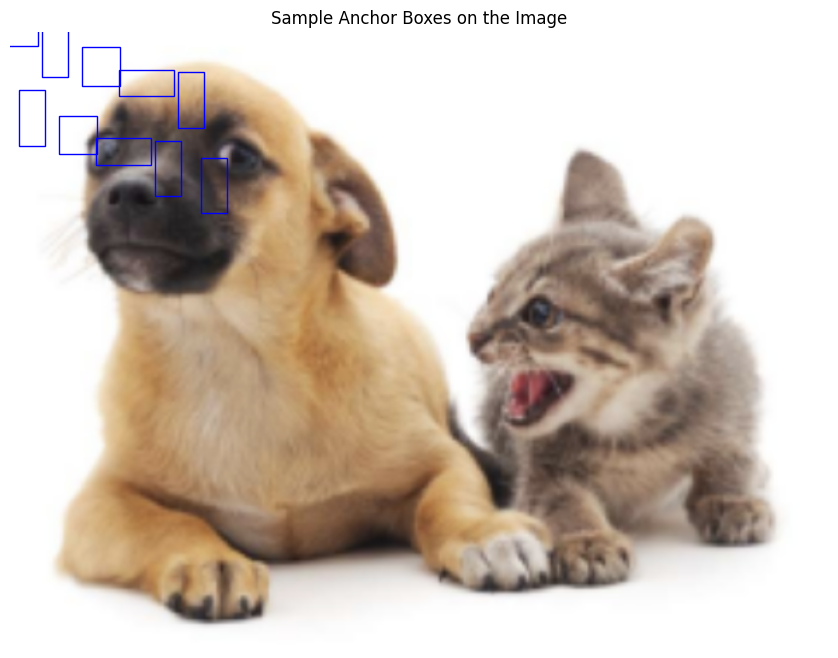

In [1]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Function to load an image
def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return image

# Function to visualize a subset of anchor boxes on the image
    """
    Anchor Boxes in object detection models like Faster R-CNN do have different sizes and aspect ratios. 
    The concept of using multiple anchor boxes of varying sizes and aspect ratios is fundamental to how these models detect objects 
    of different shapes and scales in an image.
    
    Different Sizes: Anchor boxes are predefined with multiple sizes. The idea is to cover a variety of object sizes that might appear in an image.
        For instance, in a street scene, you might want to detect objects as small as a traffic light and as large as a bus.
    
    Different Aspect Ratios: Besides different sizes, anchor boxes also come in different aspect ratios. 
        Aspect ratio is the ratio of width to height. This variability allows the model to better match the shape of different objects. 
        For example, a pedestrian (tall and narrow) and a car (wide and short)
    
    Grid Coverage: The entire image is typically divided into a grid, and at each grid cell,
        multiple anchor boxes of these various sizes and aspect ratios are placed. 
    
    Overlap and Selection: It's common for these anchor boxes to overlap significantly. 
        The model then learns to select and adjust the best fitting anchor boxes for each object during training.    
        
    Training and Refinement: During training, each anchor box is labeled with whether it intersects significantly with a ground-truth object
        (and if so, which object). The model also learns to adjust the size and position of these anchor boxes to better fit the objects.        
    """
def illustrate_anchor_boxes(image, model):
    
    # Convert image to tensor
    image_tensor = F.to_tensor(image).unsqueeze(0)

    # Get the feature map size from the model's backbone
    with torch.no_grad():
        model.eval()
        features = model.backbone(image_tensor)
        feature_map_sizes = [feature.shape[-2:] for feature in features.values()]

    # Get strides for each feature map
    strides = [torch.tensor([1, 1])] * len(feature_map_sizes)

    # Generate a grid of anchors for one of the feature maps
    anchor_generator = model.rpn.anchor_generator
    anchors = anchor_generator.grid_anchors(feature_map_sizes, strides)[0]
    
    # Select a few anchors for visualization (to avoid clutter)
    num_anchors_to_display = 10  # Number of anchors to display
    selected_indices = np.linspace(0, len(anchors) - 1, num=num_anchors_to_display, dtype=int)
    selected_anchors = anchors[selected_indices]

    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    ax = plt.gca()

    # Draw selected anchor boxes
    for anchor in selected_anchors:
        anchor = anchor.cpu().numpy()
        rect = plt.Rectangle((anchor[0], anchor[1]), anchor[2] - anchor[0], anchor[3] - anchor[1], fill=False, color='blue', linewidth=1)
        ax.add_patch(rect)

    plt.title("Sample Anchor Boxes on the Image")
    plt.axis('off')
    plt.show()

# Load a pre-trained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(pretrained=True)

# Assuming the image 'dog_cat.png' is available at the specified path
image_path = './img/comp_vision/dog_cat.png'
image = load_image(image_path)

# Illustrate a subset of anchor boxes on the image
illustrate_anchor_boxes(image, model)


# Multiscale Object Detection

### Multiscale Anchor Boxes:

- We can generate different numbers of anchor boxes of different sizes. Intuitively, smaller objects are more likely to appear on an image than larger ones.

- Since we have generated multiscale anchor boxes, we will use them to detect objects of various sizes at different scales.

- When the feature maps at different layers have varying-size receptive fields on the input image, they can be used to detect objects of different sizes.

- For example, we can design a neural network where units of feature maps that are closer to the output layer have wider receptive fields, so they can detect larger objects from the input image.



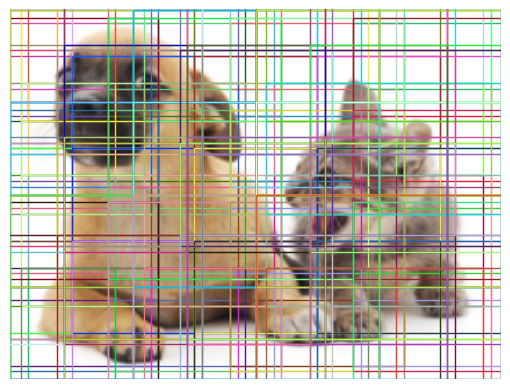

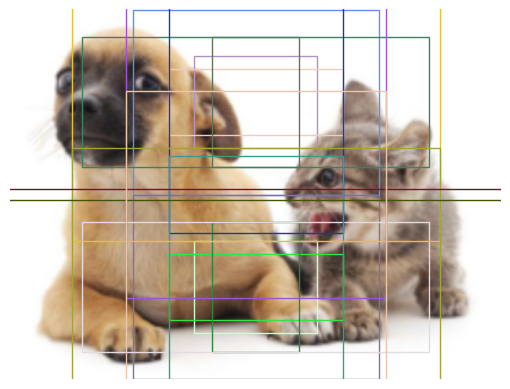

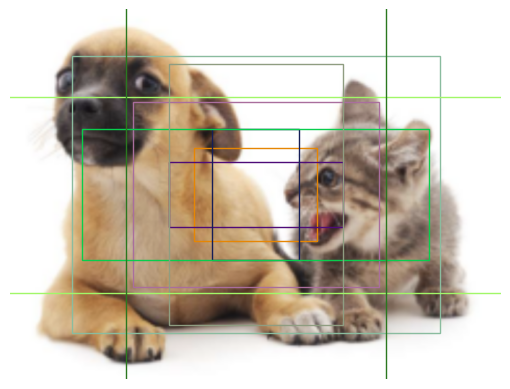

In [24]:
import torch
import numpy as np
from itertools import product
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def display_anchors(fmap_w, fmap_h, sizes, ratios, img):
    # Calculate the strides and the center coordinates of the anchors
    stride_h = img.shape[0] / fmap_h
    stride_w = img.shape[1] / fmap_w
    center_ys = (torch.arange(fmap_h) + 0.5) * stride_h
    center_xs = (torch.arange(fmap_w) + 0.5) * stride_w

    # Compute anchor boxes for each center
    anchors = []
    for size, ratio in product(sizes, ratios):
        w = size * img.shape[1] * np.sqrt(ratio)  # Width relative to image width
        h = size * img.shape[0] / np.sqrt(ratio)  # Height relative to image height
        for x, y in product(center_xs, center_ys):
            anchors.append([x - w / 2, y - h / 2, x + w / 2, y + h / 2])

    anchors = torch.tensor(anchors)

    # Plot the image and the anchors
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    for anchor in anchors:
        rect = patches.Rectangle((anchor[0], anchor[1]), anchor[2] - anchor[0], anchor[3] - anchor[1], 
                                 linewidth=1, edgecolor=np.random.rand(3,), facecolor='none')
        ax.add_patch(rect)
    plt.axis('off')
    plt.show()

# Example usage:
img_path = './img/comp_vision/dog_cat.png'
img = plt.imread(img_path)  # Load an image

# Define sizes as fractions of the image size
# For example, 0.25 means anchor size will be 25% of the image size
sizes = [0.25, 0.5, 0.75]  # Example sizes
ratios = [1, 2, 0.5]  # Example aspect ratios

# Now we display the anchors on the image
display_anchors(fmap_w=4, fmap_h=4, sizes=sizes, ratios=ratios, img=img)
display_anchors(fmap_w=1, fmap_h=2, sizes=sizes, ratios=ratios, img=img)
display_anchors(fmap_w=1, fmap_h=1, sizes=sizes, ratios=ratios, img=img)
